In [1]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
import scipy.stats as s
import seaborn as sns

In [2]:
#Load dataset
data=pd.read_csv('house_sales_train.csv')

In [3]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [5]:
# Print Five Rows
print(data.head(5))

   Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0   1          60       RL         65.0     8450   Pave   NaN      Reg   
1   2          20       RL         80.0     9600   Pave   NaN      Reg   
2   3          60       RL         68.0    11250   Pave   NaN      IR1   
3   4          70       RL         60.0     9550   Pave   NaN      IR1   
4   5          60       RL         84.0    14260   Pave   NaN      IR1   

  LandContour Utilities  ... PoolArea PoolQC Fence MiscFeature MiscVal MoSold  \
0         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      2   
1         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      5   
2         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      9   
3         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      2   
4         Lvl    AllPub  ...        0    NaN   NaN         NaN       0     12   

  YrSold  SaleType  SaleCondition  SalePrice  
0   2008        WD   

In [6]:
# Find Shape and Size
data.shape

(1460, 81)

In [7]:
data.size

118260

In [8]:
#Print Column into List
print(data.columns.tolist())

['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC'

#### SalePrice is a target variable 

In [9]:
#Find datatypes 
data.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

###### Changing Datatypes

In [10]:
data['MSZoning']=data['MSZoning'].astype('category')
data['MSZoning'].dtypes

CategoricalDtype(categories=['C (all)', 'FV', 'RH', 'RL', 'RM'], ordered=False)

In [11]:
data['Neighborhood']=data['Neighborhood'].astype('category')
data['Neighborhood'].dtypes

CategoricalDtype(categories=['Blmngtn', 'Blueste', 'BrDale', 'BrkSide', 'ClearCr',
                  'CollgCr', 'Crawfor', 'Edwards', 'Gilbert', 'IDOTRR',
                  'MeadowV', 'Mitchel', 'NAmes', 'NPkVill', 'NWAmes',
                  'NoRidge', 'NridgHt', 'OldTown', 'SWISU', 'Sawyer',
                  'SawyerW', 'Somerst', 'StoneBr', 'Timber', 'Veenker'],
                 ordered=False)

In [12]:
data['CentralAir']=np.where(data['CentralAir']=="Y",True,False)

In [13]:
data['SaleType']=data['SaleType'].astype('category')
data['SaleType'].dtypes

CategoricalDtype(categories=['COD', 'CWD', 'Con', 'ConLD', 'ConLI', 'ConLw', 'New', 'Oth',
                  'WD'],
                 ordered=False)

In [14]:
#Investigate Numeric Column
numeric_data=numeric_data=data.select_dtypes(include=[np.number])

In [369]:
numeric_data

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
5,6,50,85.0,14115,5,5,1993,1995,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.0,2,480,40,30,0,320,0,0,700,10,2009,143000
6,7,20,75.0,10084,8,5,2004,2005,186.0,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.0,2,636,255,57,0,0,0,0,0,8,2007,307000
7,8,60,NaN,10382,7,6,1973,1973,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.0,2,484,235,204,228,0,0,0,350,11,2009,200000
8,9,50,51.0,6120,7,5,1931,1950,0.0,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.0,2,468,90,0,205,0,0,0,0,4,2008,129900
9,10,190,50.0,7420,5,6,1939,1950,0.0,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.0,1,205,0,4,0,0,0,0,0,1,2008,118000


In [370]:
#Displat Categorical Variables
category_data=category_data=data.select_dtypes(exclude=[np.number])

In [371]:
category_data

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,False,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,False,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,False,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,False,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,False,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
5,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,Wood,Gd,TA,No,GLQ,Unf,GasA,Ex,False,SBrkr,TA,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,MnPrv,Shed,WD,Normal
6,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Av,GLQ,Unf,GasA,Ex,False,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
7,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,Stone,TA,TA,CBlock,Gd,TA,Mn,ALQ,BLQ,GasA,Ex,False,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,Shed,WD,Normal
8,RM,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,Gable,CompShg,BrkFace,Wd Shng,None,TA,TA,BrkTil,TA,TA,No,Unf,Unf,GasA,Gd,False,FuseF,TA,Min1,TA,Detchd,Unf,Fa,TA,Y,NaN,NaN,NaN,WD,Abnorml
9,RL,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,BrkTil,TA,TA,No,GLQ,Unf,GasA,Ex,False,SBrkr,TA,Typ,TA,Attchd,RFn,Gd,TA,Y,NaN,NaN,NaN,WD,Normal


In [372]:
#Check missing values
data.notnull()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False,False,True,True,True,True,True,True
1,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False,False,True,True,True,True,True,True
2,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False,False,True,True,True,True,True,True
3,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False,False,True,True,True,True,True,True
4,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False,False,True,True,True,True,True,True
5,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True
6,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False,False,True,True,True,True,True,True
7,True,True,True,False,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,Tru

In [375]:
#Find total missing values in data
data.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [374]:
#Handle Missing Values

In [15]:
data['LotFrontage']=data['LotFrontage'].fillna(data['LotFrontage'].mean())

In [16]:
data['MasVnrArea']=data['MasVnrArea'].fillna(data['MasVnrArea'].mean())

In [17]:
data['MasVnrType']=data['MasVnrType'].fillna(data['MasVnrType'].mode()[0])

In [18]:
data['BsmtQual']=data['BsmtQual'].fillna(data['BsmtQual'].mode()[0])

In [19]:
data['BsmtCond']=data['BsmtCond'].fillna(data['BsmtCond'].mode()[0])

In [20]:
data['BsmtExposure']=data['BsmtExposure'].fillna(data['BsmtExposure'].mode()[0])

In [21]:
data['BsmtFinType1']=data['BsmtFinType1'].fillna(data['BsmtFinType1'].mode()[0])

In [22]:
data['BsmtFinType2']=data['BsmtFinType2'].fillna(data['BsmtFinType2'].mode()[0])

In [23]:
data['Electrical']=data['Electrical'].fillna(data['Electrical'].mode()[0])

In [24]:
data['FireplaceQu']=data['FireplaceQu'].fillna(data['FireplaceQu'].mode()[0])

In [25]:
data['GarageType']=data['GarageType'].fillna(data['GarageType'].mode()[0])

In [26]:
data['GarageYrBlt']=data['GarageYrBlt'].fillna(data['GarageYrBlt'].mean())

In [27]:
data['GarageFinish']=data['GarageFinish'].fillna(data['GarageFinish'].mode()[0])

In [28]:
data['GarageQual']=data['GarageQual'].fillna(data['GarageQual'].mode()[0])

In [29]:
data['GarageCond']=data['GarageCond'].fillna(data['GarageCond'].mode()[0])

In [30]:
data.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 81, dtype: int64

In [31]:
#delet those column that contain NAN values too Large
del data['Alley']

In [32]:
del data['Fence']

In [33]:
del data['PoolQC']

In [34]:
del data['MiscFeature']

In [396]:
data.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual 

##### Plot bar charts for nine of the categorical variables where each bar represents the count of unique category.

In [174]:
#1 
data['MSZoning'].unique()

['RL', 'RM', 'C (all)', 'FV', 'RH']
Categories (5, object): ['RL', 'RM', 'C (all)', 'FV', 'RH']

In [175]:
data['MSZoning'].value_counts()

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64

<AxesSubplot:title={'center':'MSZoning BarChart'}>

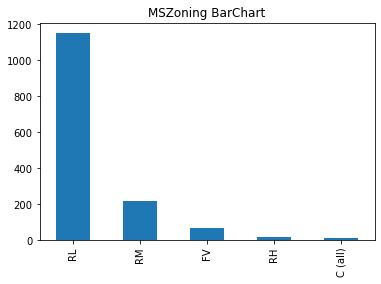

In [176]:
data.MSZoning.value_counts().plot(kind='bar',title='MSZoning BarChart')


In [177]:
#2 
data['Neighborhood'].unique()

['CollgCr', 'Veenker', 'Crawfor', 'NoRidge', 'Mitchel', ..., 'NPkVill', 'Blmngtn', 'BrDale', 'SWISU', 'Blueste']
Length: 25
Categories (25, object): ['CollgCr', 'Veenker', 'Crawfor', 'NoRidge', ..., 'Blmngtn', 'BrDale', 'SWISU', 'Blueste']

In [178]:
data.Neighborhood.value_counts()

NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
SWISU       25
StoneBr     25
Blmngtn     17
MeadowV     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

<AxesSubplot:title={'center':'Neighborhood BarCharts'}>

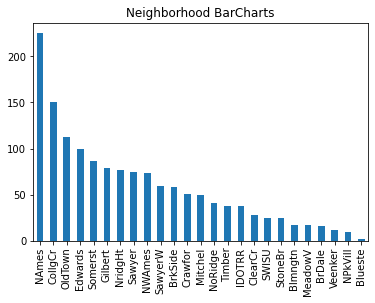

In [179]:
data.Neighborhood.value_counts().plot(kind="bar",title='Neighborhood BarCharts')

In [180]:
#3
data['BldgType'].unique()

array(['1Fam', '2fmCon', 'Duplex', 'TwnhsE', 'Twnhs'], dtype=object)

In [181]:
data.BldgType.value_counts()

1Fam      1220
TwnhsE     114
Duplex      52
Twnhs       43
2fmCon      31
Name: BldgType, dtype: int64

<AxesSubplot:title={'center':'BldgType BarCharts'}>

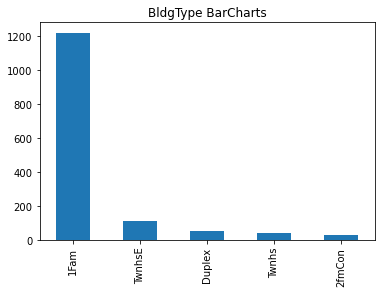

In [182]:
data.BldgType.value_counts().plot(kind='bar',title='BldgType BarCharts')

In [183]:
#4
data['Exterior1st'].unique()

array(['VinylSd', 'MetalSd', 'Wd Sdng', 'HdBoard', 'BrkFace', 'WdShing',
       'CemntBd', 'Plywood', 'AsbShng', 'Stucco', 'BrkComm', 'AsphShn',
       'Stone', 'ImStucc', 'CBlock'], dtype=object)

In [184]:
data['Exterior1st'].value_counts()

VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     61
BrkFace     50
WdShing     26
Stucco      25
AsbShng     20
Stone        2
BrkComm      2
CBlock       1
AsphShn      1
ImStucc      1
Name: Exterior1st, dtype: int64

<AxesSubplot:title={'center':'Exterior1st BarCharts'}>

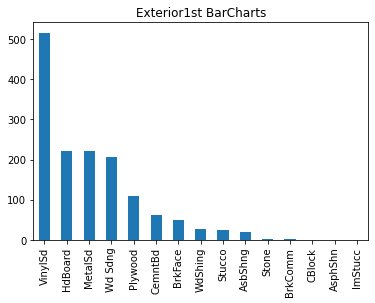

In [185]:
data['Exterior1st'].value_counts().plot(kind='bar',title='Exterior1st BarCharts')

In [186]:
#5
data['BsmtQual'].unique()

array(['Gd', 'TA', 'Ex', 'Fa'], dtype=object)

In [187]:
data['BsmtQual'].value_counts()

TA    686
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

<AxesSubplot:title={'center':'BsmtQual BarCharts'}>

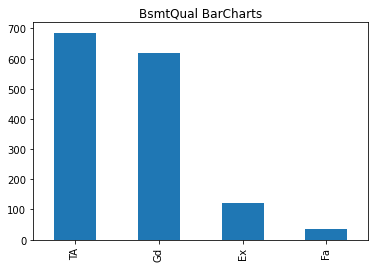

In [188]:
data['BsmtQual'].value_counts().plot(kind='bar',title='BsmtQual BarCharts')

In [189]:
#6 
data['BsmtFinType1'].unique()

array(['GLQ', 'ALQ', 'Unf', 'Rec', 'BLQ', 'LwQ'], dtype=object)

In [190]:
data['BsmtFinType1'].value_counts()

Unf    467
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64

<AxesSubplot:title={'center':'BsmtFinType1'}>

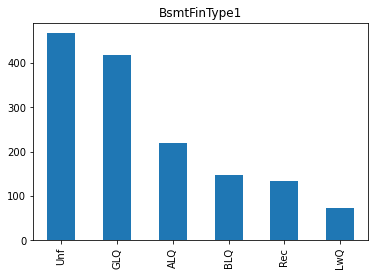

In [191]:
data['BsmtFinType1'].value_counts().plot(kind='bar',title='BsmtFinType1')

In [192]:
#7
data['KitchenQual'].unique()

array(['Gd', 'TA', 'Ex', 'Fa'], dtype=object)

In [193]:
data['KitchenQual'].value_counts()

TA    735
Gd    586
Ex    100
Fa     39
Name: KitchenQual, dtype: int64

<AxesSubplot:title={'center':'Kitchen BarCharts'}>

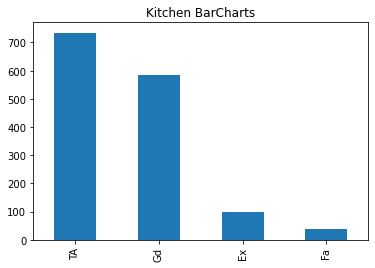

In [194]:
data['KitchenQual'].value_counts().plot(kind='bar',title='Kitchen BarCharts')

In [195]:
#8
data['MasVnrType'].unique()

array(['BrkFace', 'None', 'Stone', 'BrkCmn'], dtype=object)

In [196]:
data['MasVnrType'].value_counts()

None       872
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

<AxesSubplot:title={'center':'MasVnrType BarCharts'}>

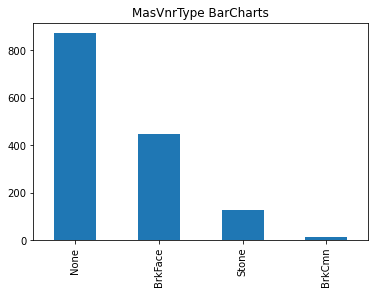

In [197]:
data['MasVnrType'].value_counts().plot(kind='bar',title='MasVnrType BarCharts')

In [198]:
#9
data['ExterQual'].unique()

array(['Gd', 'TA', 'Ex', 'Fa'], dtype=object)

In [199]:
data['ExterQual'].value_counts()

TA    906
Gd    488
Ex     52
Fa     14
Name: ExterQual, dtype: int64

<AxesSubplot:title={'center':'ExterQual BarCharts'}>

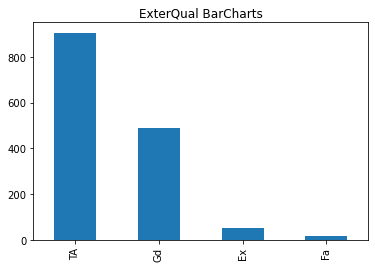

In [200]:
data['ExterQual'].value_counts().plot(kind='bar',title='ExterQual BarCharts')

###### Plot the histograms for nine numeric variables with normal curve fitting and analyse the plots to find the presence of skewness in numerical data variables.

C:\Users\USER\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='MSSubClass', ylabel='Density'>

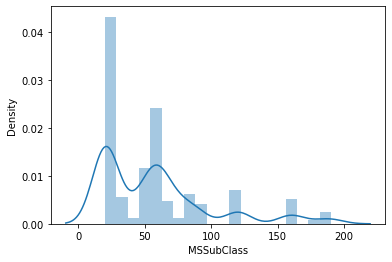

In [201]:
#1
sns.distplot(data['MSSubClass'])

C:\Users\USER\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='OverallQual', ylabel='Density'>

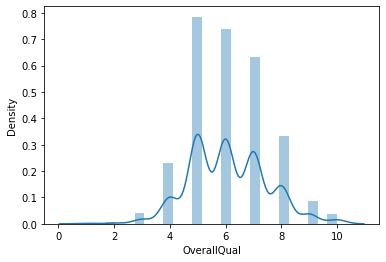

In [202]:
#2
sns.distplot(data['OverallQual'])

C:\Users\USER\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='1stFlrSF', ylabel='Density'>

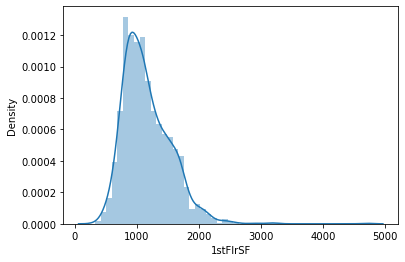

In [212]:
#3
sns.distplot(data['1stFlrSF'])

C:\Users\USER\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='YearBuilt', ylabel='Density'>

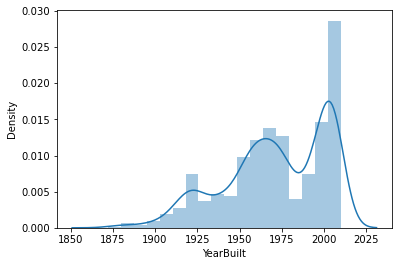

In [204]:
#4
sns.distplot(data['YearBuilt'])

C:\Users\USER\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='GarageArea', ylabel='Density'>

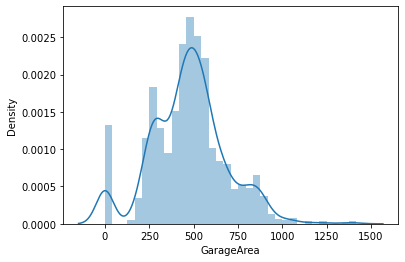

In [205]:
#5
sns.distplot(data['GarageArea'])

C:\Users\USER\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='LotFrontage', ylabel='Density'>

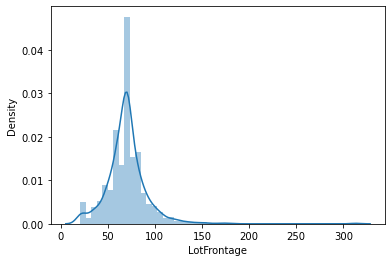

In [206]:
#6
sns.distplot(data['LotFrontage'])

C:\Users\USER\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='GrLivArea', ylabel='Density'>

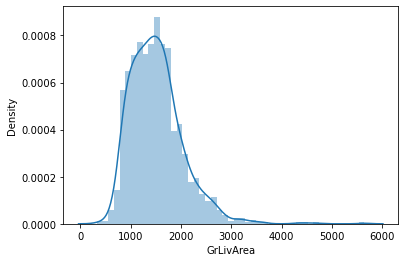

In [207]:
#7
sns.distplot(data['GrLivArea'])

C:\Users\USER\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='TotalBsmtSF', ylabel='Density'>

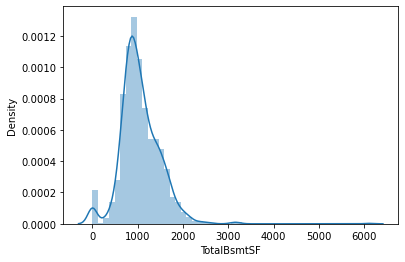

In [209]:
#8
sns.distplot(data['TotalBsmtSF'])

C:\Users\USER\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

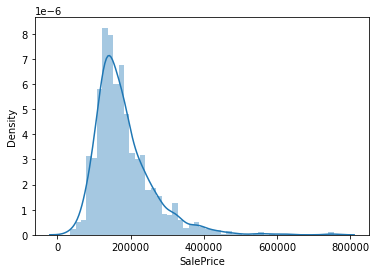

In [210]:
#9
sns.distplot(data['SalePrice'])

######  Select some of the categorical variables or all and use Chi –Square to check association between them. Drop columns that you think may not be very useful for the analysis.Bonus Task: How can you use Chi Squared for the target variable which is quantitative?

In [35]:
chi=pd.crosstab(data['MSZoning'],data['CentralAir'])

In [36]:
b=s.chi2_contingency(chi)

In [37]:
b

(132.3537614723155,
 1.2217031702230047e-27,
 4,
 array([[6.50684932e-01, 9.34931507e+00],
        [4.22945205e+00, 6.07705479e+01],
        [1.04109589e+00, 1.49589041e+01],
        [7.48938356e+01, 1.07610616e+03],
        [1.41849315e+01, 2.03815068e+02]]))

In [317]:
def test_dependency(data,f1,f2,alpha):
    chi=pd.crosstab(data[f1],data[f2])
    b=s.chi2_contingency(chi)
    chi2_statistic=b[0]
    p_value=b[1]
    dof=b[2]
    critical_value=s.chi2.ppf(q=1-alpha, df=dof)
    print('Significance level: ',alpha)
    print('Degree of Freedom: ',dof)
    print('chi-square statistic:',chi2_statistic)
    print('critical_value:',critical_value)
    print('p-value:',p_value)
    
    if chi2_statistic>=critical_value:
        print("Reject H0,There is a relationship between 2 categorical variables")
    else:
        print("Retain H0,There is no relationship between 2 categorical variables")
    
    if p_value<=alpha:
        print("Reject H0,There is a relationship between 2 categorical variables")
    else:
        print("Retain H0,There is no relationship between 2 categorical variables")
    
    


In [313]:
test_dependency(data,'MSZoning','CentralAir',0.05)

Significance level:  0.05
Degree of Freedom:  4
chi-square statistic: 132.3537614723155
critical_value: 9.487729036781154
p-value: 1.2217031702230047e-27
Reject H0,There is a relationship between 2 categorical variables
Reject H0,There is a relationship between 2 categorical variables


In [319]:
test_dependency(data,'Neighborhood','CentralAir',0.05)

Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 237.0844783257392
critical_value: 36.41502850180731
p-value: 5.90333881382326e-37
Reject H0,There is a relationship between 2 categorical variables
Reject H0,There is a relationship between 2 categorical variables


In [320]:
test_dependency(data,'HouseStyle','CentralAir',0.05)

Significance level:  0.05
Degree of Freedom:  7
chi-square statistic: 86.37522435409493
critical_value: 14.067140449340169
p-value: 6.854147108912716e-16
Reject H0,There is a relationship between 2 categorical variables
Reject H0,There is a relationship between 2 categorical variables


In [322]:
test_dependency(data,'ExterQual','CentralAir',0.05)

Significance level:  0.05
Degree of Freedom:  3
chi-square statistic: 116.02985293930168
critical_value: 7.814727903251179
p-value: 5.525330051023636e-25
Reject H0,There is a relationship between 2 categorical variables
Reject H0,There is a relationship between 2 categorical variables


In [323]:
test_dependency(data,'KitchenQual','CentralAir',0.05)

Significance level:  0.05
Degree of Freedom:  3
chi-square statistic: 174.3270979311282
critical_value: 7.814727903251179
p-value: 1.4806225009699904e-37
Reject H0,There is a relationship between 2 categorical variables
Reject H0,There is a relationship between 2 categorical variables


#### Bonus Task: How can you use Chi Squared for the target variable which is quantitative.

In [135]:
df=data.copy()

In [121]:
df['SalePrice'].sort_values(ascending=True)

495      34900
916      35311
968      37900
533      39300
30       40000
         ...  
803     582933
898     611657
1169    625000
1182    745000
691     755000
Name: SalePrice, Length: 1460, dtype: int64

In [151]:
((df['SalePrice'] <140000)).sum()

489

In [150]:
((df['SalePrice'] >=140000) &(df['SalePrice'] <=190000)).sum()

488

In [148]:
((df['SalePrice']>190000)&(df['SalePrice']<=450000)).sum()

469

In [152]:
((df['SalePrice'] >450000)).sum()


14

In [153]:
df['SalePrice'] = np.where((df['SalePrice'] < 150000) ,'Low',
                           np.where((df['SalePrice']>150000) &(df['SalePrice']<=200000),'Average' ,
                                   np.where((df['SalePrice']>200000)&(df['SalePrice']>=450000),'High',
                                            'Very High'   )))
                                 

In [154]:
df['SalePrice']

0       Very High
1         Average
2       Very High
3             Low
4       Very High
          ...    
1455      Average
1456    Very High
1457    Very High
1458          Low
1459          Low
Name: SalePrice, Length: 1460, dtype: object

In [155]:
sp=pd.crosstab(df['BldgType'],df['SalePrice'])

In [156]:
b=s.chi2_contingency(sp)

In [157]:
b

(71.17518627844817,
 1.9293541145911792e-10,
 12,
 array([[3.45945205e+02, 1.16986301e+01, 5.13904110e+02, 3.48452055e+02],
        [8.79041096e+00, 2.97260274e-01, 1.30582192e+01, 8.85410959e+00],
        [1.47452055e+01, 4.98630137e-01, 2.19041096e+01, 1.48520548e+01],
        [1.21931507e+01, 4.12328767e-01, 1.81130137e+01, 1.22815068e+01],
        [3.23260274e+01, 1.09315068e+00, 4.80205479e+01, 3.25602740e+01]]))

In [158]:
def test_dependency(df,f1,f2,alpha):
    sp=pd.crosstab(df[f1],df[f2])
    b=s.chi2_contingency(sp)
    chi2_statistic=b[0]
    p_value=b[1]
    dof=b[2]
    critical_value=s.chi2.ppf(q=1-alpha, df=dof)
    print('Significance level: ',alpha)
    print('Degree of Freedom: ',dof)
    print('chi-square statistic:',chi2_statistic)
    print('critical_value:',critical_value)
    print('p-value:',p_value)
    
    if chi2_statistic>=critical_value:
        print("Reject H0,There is a relationship between 2 categorical variables")
    else:
        print("Retain H0,There is no relationship between 2 categorical variables")
    
    if p_value<=alpha:
        print("Reject H0,There is a relationship between 2 categorical variables")
    else:
        print("Retain H0,There is no relationship between 2 categorical variables")
    
    


In [159]:
test_dependency(df,'BldgType','SalePrice',0.05)

Significance level:  0.05
Degree of Freedom:  12
chi-square statistic: 71.17518627844817
critical_value: 21.02606981748307
p-value: 1.9293541145911792e-10
Reject H0,There is a relationship between 2 categorical variables
Reject H0,There is a relationship between 2 categorical variables


###### Use Pearson Correlation Coefficient to check strength of correlation .

In [216]:
# Numeric Column
numeric_data=data.select_dtypes(include=[np.number])

In [215]:
numeric_data

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.000000,8450,7,5,2003,2003,196.000000,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.000000,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.000000,9600,6,8,1976,1976,0.000000,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.000000,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.000000,11250,7,5,2001,2002,162.000000,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.000000,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.000000,9550,7,5,1915,1970,0.000000,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.000000,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.000000,14260,8,5,2000,2000,350.000000,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.000000,3,836,192,84,0,0,0,0,0,12,2008,250000
5,6,50,85.000000,14115,5,5,1993,1995,0.000000,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.000000,2,480,40,30,0,320,0,0,700,10,2009,143000
6,7,20,75.000000,10084,8,5,2004,2005,186.000000,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.000000,2,636,255,57,0,0,0,0,0,8,2007,307000
7,8,60,70.049958,10382,7,6,1973,1973,240.000000,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.000000,2,484,235,204,228,0,0,0,350,11,2009,200000
8,9,50,51.000000,6120,7,5,1931,1950,0.000000,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.000000,2,468,90,0,205,0,0,0,0,4,2008,129900
9,10,190,50.000000,7420,5,6,1939,1950,0.000000,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.000000,1,205,0,4,0,0,0,0,0,1,2008,118000


In [256]:
numeric_col=numeric_data.drop(data[['BsmtFinSF2','LowQualFinSF','BsmtFullBath','BsmtHalfBath','HalfBath','EnclosedPorch','PoolArea','ScreenPorch','3SsnPorch','Fireplaces','WoodDeckSF']],axis=1)

In [257]:
numeric_col['SalePrice'].value_counts()

140000    20
135000    17
145000    14
155000    14
190000    13
110000    13
160000    12
115000    12
139000    11
130000    11
125000    10
143000    10
185000    10
180000    10
144000    10
175000     9
147000     9
100000     9
127000     9
165000     8
176000     8
170000     8
129000     8
230000     8
250000     8
200000     8
141000     8
215000     8
148000     7
173000     7
119000     7
128000     7
178000     7
120000     7
181000     7
112000     7
235000     7
174000     7
189000     6
239000     6
152000     6
187500     6
157000     6
240000     6
205000     6
132000     6
113000     6
127500     6
118000     6
108000     6
260000     6
158000     6
225000     6
137500     6
132500     6
133000     6
124000     6
137000     5
172500     5
207500     5
275000     5
105000     5
136500     5
177000     5
290000     5
179900     5
192000     5
214000     5
154000     5
220000     5
210000     5
151000     5
171000     5
184000     4
280000     4
128500     4
315000     4

In [258]:
co_matrix=numeric_col.corr()

In [259]:
print(co_matrix['SalePrice'].sort_values(ascending=False))

SalePrice       1.000000
OverallQual     0.790982
GrLivArea       0.708624
GarageCars      0.640409
GarageArea      0.623431
TotalBsmtSF     0.613581
1stFlrSF        0.605852
FullBath        0.560664
TotRmsAbvGrd    0.533723
YearBuilt       0.522897
YearRemodAdd    0.507101
MasVnrArea      0.475241
GarageYrBlt     0.470177
BsmtFinSF1      0.386420
LotFrontage     0.334901
2ndFlrSF        0.319334
OpenPorchSF     0.315856
LotArea         0.263843
BsmtUnfSF       0.214479
BedroomAbvGr    0.168213
MoSold          0.046432
MiscVal        -0.021190
Id             -0.021917
YrSold         -0.028923
OverallCond    -0.077856
MSSubClass     -0.084284
KitchenAbvGr   -0.135907
Name: SalePrice, dtype: float64


In [260]:
co_matrix

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,OpenPorchSF,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.011156,-0.009601,-0.033226,-0.028365,0.012609,-0.012713,-0.021998,-0.050199,-0.005024,-0.007940,-0.015415,0.010496,0.005590,0.008273,0.005587,0.037719,0.002951,0.027239,0.000070,0.016570,0.017634,-0.000477,-0.006242,0.021172,0.000712,-0.021917
MSSubClass,0.011156,1.000000,-0.357056,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.022895,-0.069836,-0.140759,-0.238518,-0.251758,0.307886,0.074853,0.131608,-0.023438,0.281721,0.040380,0.080187,-0.040110,-0.098672,-0.006100,-0.007683,-0.013585,-0.021407,-0.084284
LotFrontage,-0.009601,-0.357056,1.000000,0.306795,0.234196,-0.052820,0.117598,0.082746,0.179283,0.215828,0.122156,0.363358,0.414266,0.072483,0.368392,0.180424,0.237023,-0.005805,0.320146,0.064324,0.269729,0.323663,0.137454,0.001168,0.010158,0.006768,0.334901
LotArea,-0.033226,-0.139781,0.306795,1.000000,0.105806,-0.005636,0.014228,0.013788,0.103960,0.214103,-0.002618,0.260833,0.299475,0.050986,0.263116,0.126031,0.119690,-0.017784,0.190015,-0.024812,0.154871,0.180403,0.084774,0.038068,0.001205,-0.014261,0.263843
OverallQual,-0.028365,0.032628,0.234196,0.105806,1.000000,-0.091932,0.572323,0.550684,0.410238,0.239666,0.308159,0.537808,0.476224,0.295493,0.593007,0.550600,0.101676,-0.183882,0.427452,0.518018,0.600671,0.562022,0.308819,-0.031406,0.070815,-0.027347,0.790982
OverallCond,0.012609,-0.059316,-0.052820,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.127788,-0.046231,-0.136841,-0.171098,-0.144203,0.028942,-0.079686,-0.194149,0.012980,-0.087001,-0.057583,-0.306169,-0.185758,-0.151521,-0.032589,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,-0.012713,0.027850,0.117598,0.014228,0.572323,-0.375983,1.000000,0.592855,0.314745,0.249503,0.149040,0.391452,0.281986,0.010308,0.199010,0.468271,-0.070651,-0.174800,0.095589,0.780555,0.537850,0.478954,0.188686,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,-0.021998,0.040581,0.082746,0.013788,0.550684,0.073741,0.592855,1.000000,0.179186,0.128451,0.181133,0.291066,0.240379,0.140024,0.287389,0.439046,-0.040581,-0.149598,0.191740,0.618130,0.420622,0.371600,0.226298,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,-0.050199,0.022895,0.179283,0.103960,0.410238,-0.127788,0.314745,0.179186,1.000000,0.263582,0.114184,0.362452,0.342160,0.174019,0.389893,0.275730,0.102417,-0.037364,0.280027,0.249367,0.363778,0.372567,0.124965,-0.029815,-0.005940,-0.008184,0.475241
BsmtFinSF1,-0.005024,-0.069836,0.215828,0.214103,0.239666,-0.046231,0.249503,0.128451,0.263582,1.000000,-0.495251,0.522396,0.445863,-0.137079,0.208171,0.058543,-0.107355,-0.081007,0.044316,0.150338,0.224054,0.296970,0.111761,0.003571,-0.015727,0.014359,0.386420


In [271]:
co_matrix.style.background_gradient(cmap='coolwarm').set_precision(2)

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,OpenPorchSF,MiscVal,MoSold,YrSold,SalePrice
Id,1.00,0.01,-0.01,-0.03,-0.03,0.01,-0.01,-0.02,-0.05,-0.01,-0.01,-0.02,0.01,0.01,0.01,0.01,0.04,0.00,0.03,0.00,0.02,0.02,-0.00,-0.01,0.02,0.00,-0.02
MSSubClass,0.01,1.00,-0.36,-0.14,0.03,-0.06,0.03,0.04,0.02,-0.07,-0.14,-0.24,-0.25,0.31,0.07,0.13,-0.02,0.28,0.04,0.08,-0.04,-0.10,-0.01,-0.01,-0.01,-0.02,-0.08
LotFrontage,-0.01,-0.36,1.00,0.31,0.23,-0.05,0.12,0.08,0.18,0.22,0.12,0.36,0.41,0.07,0.37,0.18,0.24,-0.01,0.32,0.06,0.27,0.32,0.14,0.00,0.01,0.01,0.33
LotArea,-0.03,-0.14,0.31,1.00,0.11,-0.01,0.01,0.01,0.10,0.21,-0.00,0.26,0.30,0.05,0.26,0.13,0.12,-0.02,0.19,-0.02,0.15,0.18,0.08,0.04,0.00,-0.01,0.26
OverallQual,-0.03,0.03,0.23,0.11,1.00,-0.09,0.57,0.55,0.41,0.24,0.31,0.54,0.48,0.30,0.59,0.55,0.10,-0.18,0.43,0.52,0.60,0.56,0.31,-0.03,0.07,-0.03,0.79
OverallCond,0.01,-0.06,-0.05,-0.01,-0.09,1.00,-0.38,0.07,-0.13,-0.05,-0.14,-0.17,-0.14,0.03,-0.08,-0.19,0.01,-0.09,-0.06,-0.31,-0.19,-0.15,-0.03,0.07,-0.00,0.04,-0.08
YearBuilt,-0.01,0.03,0.12,0.01,0.57,-0.38,1.00,0.59,0.31,0.25,0.15,0.39,0.28,0.01,0.20,0.47,-0.07,-0.17,0.10,0.78,0.54,0.48,0.19,-0.03,0.01,-0.01,0.52
YearRemodAdd,-0.02,0.04,0.08,0.01,0.55,0.07,0.59,1.00,0.18,0.13,0.18,0.29,0.24,0.14,0.29,0.44,-0.04,-0.15,0.19,0.62,0.42,0.37,0.23,-0.01,0.02,0.04,0.51
MasVnrArea,-0.05,0.02,0.18,0.10,0.41,-0.13,0.31,0.18,1.00,0.26,0.11,0.36,0.34,0.17,0.39,0.28,0.10,-0.04,0.28,0.25,0.36,0.37,0.12,-0.03,-0.01,-0.01,0.48
BsmtFinSF1,-0.01,-0.07,0.22,0.21,0.24,-0.05,0.25,0.13,0.26,1.00,-0.50,0.52,0.45,-0.14,0.21,0.06,-0.11,-0.08,0.04,0.15,0.22,0.30,0.11,0.00,-0.02,0.01,0.39
